One of the data science skills I want to play around with is deriving insights from data that publically available. Here, lets use some  data on SF employee compensation and see what we can learn from the data.

First, per usual, load the dependencies.

In [18]:
%matplotlib inline
import requests
import json
import pandas as pd
import matplotlib.pylab as plt
import numpy as np
import requests
import seaborn as sns
import sys
sys.path.append('../../dataSandbox/forPelican/') #for loading custom plotting script
from sfBokeh import plotScatter, plotPCA

### Get the data from the API in json format

In [2]:
URL = "https://data.sfgov.org/resource/88g8-5mnd.json"
response = requests.get(URL)
response.raise_for_status()
data = response.json()

### Put it into a pandas dataframe

Notice that for some downstream steps, we should convert the data to float. Then, take a look at the data

In [4]:
df = pd.DataFrame.from_dict(data)
quantVar = ['health_dental','other_benefits','other_salaries','overtime','retirement','salaries','total_benefits','total_compensation','total_salary']
df[quantVar] = df[quantVar].astype(float)

df = df.sort_values(by='total_compensation')
df = df.reset_index()
df.head()

,index,department,department_code,employee_identifier,health_dental,job,job_code,job_family,job_family_code,organization_group,...,overtime,retirement,salaries,total_benefits,total_compensation,total_salary,union,union_code,year,year_type
0,257,Public Defender,PDR,30422,0.00,Attorney (Civil/Criminal),8177,Legal & Court,8100,Public Protection,...,0.00,0,0.0,2.32,2.32,0.00,Municipal Attorneys' Association,311,2013,Fiscal
1,992,Airport Commission,AIR,44328,0.00,Community Police Services Aide,9209,Airport Operation,9200,"Public Works, Transportation & Commerce",...,25.11,0,0.0,1.89,27.00,25.11,"SEIU - Miscellaneous, Local 1021",790,2014,Fiscal
2,349,Human Services,DSS,30542,0.00,Senior Clerk Typist,1426,"Clerical, Secretarial & Steno",1400,Human Welfare & Neighborhood Development,...,0.00,0,0.0,2.73,38.35,35.62,"SEIU - Miscellaneous, Local 1021",790,2014,Fiscal
3,597,Human Services,DSS,19864,25.11,Public Svc Aide-Public Works,9916,Public Service Aide,9900,Human Welfare & Neighborhood Development,...,0.00,0,55.1,29.38,84.48,55.10,Miscellaneous Unrepresented Employees,001,2014,Calendar
4,706,Municipal Transportation Agency,MTA,45178,0.00,Transit Operator,9163,Street Transit,9100,"Public Works, Transportation & Commerce",...,0.00,0,0.0,9.69,136.33,126.64,"Transport Workers - Transit Operators, Local 2...",253,2015,Fiscal


### A first look

There are a lot of quantitative and qualitative variables (columns) per employee (row). This should be a great setup for an unsupervised learning approach. But I don't want to give anything away yet...

Look at one variable and you can see some relationships between the variables, shown in the equations below.

In [5]:
df.loc[600]

index                                                                    563
department                                   Municipal Transportation Agency
department_code                                                          MTA
employee_identifier                                                     7435
health_dental                                                        12006.2
job                                                         Transit Operator
job_code                                                                9163
job_family                                                    Street Transit
job_family_code                                                         9100
organization_group                   Public Works, Transportation & Commerce
organization_group_code                                                   02
other_benefits                                                       6040.91
other_salaries                                                        3858.7

$$Total Benefits = Health Dental + OtherBenefits + Retirement$$

$$Total Salary = Salaries + OtherSalaries + Overtime$$

$$Total Compensation = TotalBenefits + TotalSalary$$

### Exploring salary and benefit combinations

Let's make a bar plot sorted for total employee compensation to see how total compenation is broken down in terms of salary and benefits

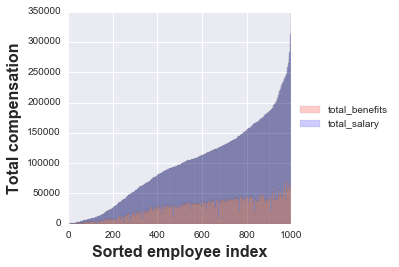

In [6]:
fig = plt.figure(figsize=(5,4), dpi=1600)
ax = plt.subplot(111)


annoIdx = set(['total_salary','total_benefits'])
colors = ['red','blue']
width = 1

condn = range(0,len(df.index))
rollBottom = np.repeat(0,len(condn)) #Create an index so the bars are stacked on top of each other
condnIdx = np.arange(len(condn))   # the x locations for the groups
colIdx = 0
for i in annoIdx:
    ax.bar(condnIdx, df[i], width, color=colors[colIdx],bottom=rollBottom,alpha=0.2,edgecolor = "none")
    rollBottom = rollBottom + list(df[i])
    colIdx = colIdx + 1
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height*0.95])
# Put a legend to the right of the current axis
ax.legend([i for i in annoIdx],loc='center left', bbox_to_anchor=(1, 0.5))

ax.set_xlabel('Sorted employee index',fontsize=16,fontweight='bold')
ax.set_ylabel('Total compensation',fontsize=16,fontweight='bold')
plt.show()

### Show me the money

Unsurprisingly, salary is the big contributor to total compensation. There are a number of departments in the data. Who makes the most? What is the spread? Let's use pandas with a seaborn boxplot to take a look.

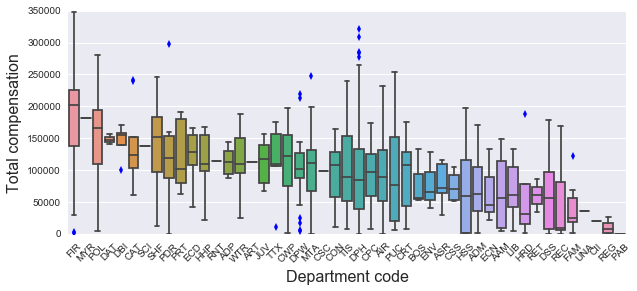

In [19]:
ob = df.groupby(['department','department_code']).mean()[['other_salaries','total_compensation','overtime']]
tcOrder = [i for i in ob.sort_values(by='total_compensation',ascending=False).index.get_level_values(1)]

fig = plt.figure(figsize=(10,4), dpi=1600)
ax = sns.boxplot(x = 'department_code',y='total_compensation',data=df,order=tcOrder)#,color='skyblue')#,order=otOrder)
labs = [i.get_text() for i in ax.get_xticklabels()]
ax.set_xticklabels(labs,rotation=45)
ax.set_xlabel('Department code',fontsize=16)
ax.set_ylabel('Total compensation',fontsize=16)

plt.show()

### Digging deeper

So city attorneys (CAT) have a sweet gig apparently. Let's look at the individual variables underlying the total salary/benefits. Pandas has some great functionality here, and making the data points transparent reveals data density.

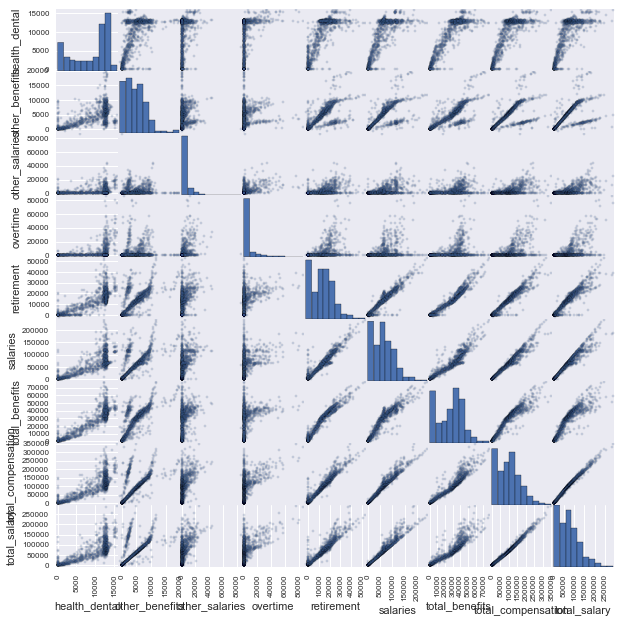

In [8]:
fig = plt.figure(figsize=(10,9), dpi=1600)
q2 = ['health_dental','other_benefits','other_salaries','overtime','retirement','salaries','total_benefits','total_compensation','total_salary','department']
ax = pd.tools.plotting.scatter_matrix(df[quantVar],figsize=(10, 10),alpha=0.2)
#sns.pairplot(df[q2],hue='department')

plt.show()

### Follow the variance

There are a lot of things going on here. Rather than trying to understand each plot one-by-one, let's use Principal Component Analysis (PCA). PCA has several benefits. It identifies
1. the axes of greatest variance in the dataset (which may be more important)
2. lower dimensional reconstructions of the data to ease interpretability and relationships between variables.

We will use the `sklearn` package to do the PCA. Also, we will remove `total_compensation`, `total_benefits`, and `total_salary`, since we explicitly know these are related and PCA works best with independent variables. Also, let's scale the data, so that the total salary doesn't just wash out the signal.

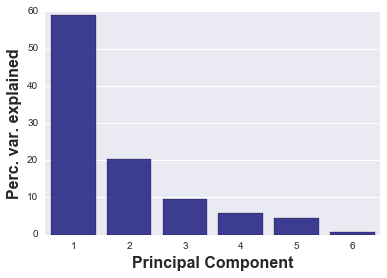

In [9]:
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA

fig = plt.figure(figsize=(6,4), dpi=1600)
ax = plt.subplot(111)

dfs = pd.DataFrame(scale(df[quantVar],with_std=True),columns=df[quantVar].columns)

dfResp = dfs['total_compensation']
#Remove as much collinearilty as possible
pred = [quantVar[i] for i in range(len(quantVar)) if quantVar[i]  not in ['total_compensation','total_salary','total_benefits']] 
dfPred = dfs[pred]

pca = PCA()
pca.fit(dfPred)

expVar = pca.explained_variance_ratio_
pca.explained_variance_ratio_
sns.barplot(x=np.arange(1,len(expVar)+1),y=expVar*100,alpha=0.8,color='darkblue')
ax.set_ylabel('Perc. var. explained',fontsize=16,fontweight='bold')
ax.set_xlabel('Principal Component',fontsize=16,fontweight='bold')
plt.show()

### Transform the data

Great, it looks like the first 3 PCs explain most of the variance. So  now, let's express the data in terms of our shiny new PCs.

In [10]:
#New data in PC space
newData = pd.DataFrame(pca.transform(dfPred),columns=['PC' + str(i+1) for i in range(len(expVar))])

#Combine with original data to keep annotations, etc
newData = pd.concat([newData, df], axis=1)

### Colorfully and interactively separated

Let's first do a plot between PC1 and PC2, the two axes of greatest variance. Also, we can encode data annotations by color to learn what drives differences between departments.

Hover over the points to see the department, job title, and a couple quantitative variables. I chose parks and rec (REC) and the fire department (FIR).


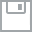
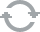
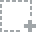
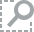
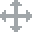
...
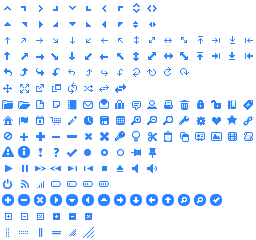
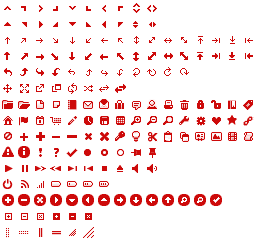
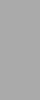
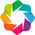
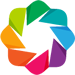

In [11]:
plotPCA(myData=newData,dpt1='REC', dpt2='FIR', xVar='PC1', yVar='PC2',legLoc='bottom_left')

### Once more, with feeling

By looking at individual data points, we can identify which departments are driving the variance in the dataset and dig deeper into what variables are acutally driving these differences.

Before doing that, let's look at PC3 vs PC1 to see if we can uncover another layer of departmental differences.


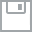
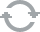
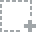
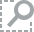
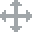
...
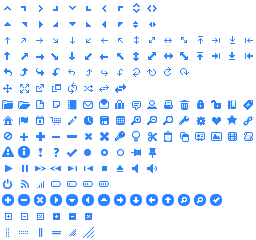
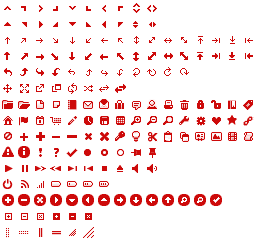
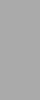
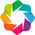
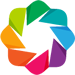

In [12]:
plotPCA(myData=newData,dpt1='DPH', dpt2='FIR', xVar='PC1', yVar='PC3',legLoc='bottom_left')

### Lock and load

Now that we know PC combinations effectively separate departments, we can ask which individual variables  drive these differences.

To do this, we'll use the loadings as a key to help us understand how each quantitative variable relates to each PC. This is actually very useful so let's take a second to think it through. 

Remember a PC is the linear combination of the quantitative variables in the dataset. So the question is, _how_ does a given variable relate to a given PC? The loadings tell us this. A positive loading indicates that a variable is correlated with that PC, and vice versa for the negative loading.

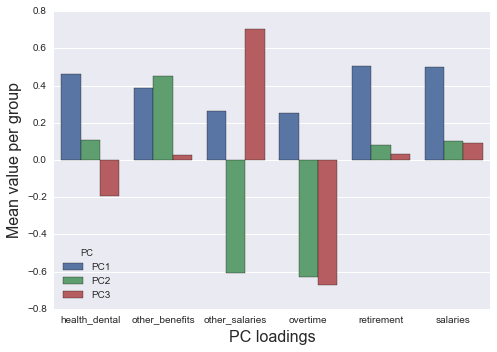

In [13]:
pcaLoad = pd.DataFrame(
    pca.components_,
    index = ['PC' + str(i+1) for i in range(len(expVar))],
    columns =  pred
    ).transpose()

fig = plt.figure(figsize=(7,5), dpi=1600)
ax = plt.subplot(111)

pcaLoad2 = pd.DataFrame(columns=['PC','values'])

#I think pandas 'melt' does an equivalent task...
p1 = pd.DataFrame({'values': pcaLoad.loc[:,'PC1'],'PC':'PC1'})
p2 = pd.DataFrame({'values': pcaLoad.loc[:,'PC2'],'PC':'PC2'})
p3 = pd.DataFrame({'values': pcaLoad.loc[:,'PC3'],'PC':'PC3'})
pcaLoad2 = pcaLoad2.append([p1,p2,p3])

pcaLoad2['loadings']=pcaLoad2.index

sns.barplot(x='loadings', y='values', hue='PC', data=pcaLoad2)
ax.set_xlabel('PC loadings', fontsize=16)
ax.set_ylabel('Mean value per group', fontsize=16)
plt.tight_layout()

### Loadings are key

Let's follow the loadings to interpret the differences we see in the PC scatter plots.

### From the first plot (PC1 vs PC2):
    
1. Because PC1 positively correlates with all the quantitive variables, I expect Fire Department to higher than the population mean, and vice versa for Parks & Rec.

2. PC2 is negatively correlated with other_salaries and positively correlated with other_benefits. Because the Fire Department has a lower value for PC2, we expect lower "other_benefits" and higher "other_salaries"

    


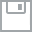
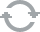
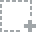
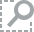
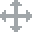
...
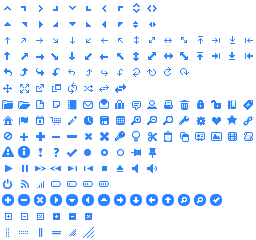
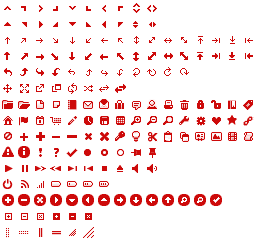
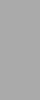
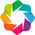
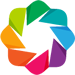

In [14]:
plotScatter(df,'REC','FIR','total_compensation','retirement',legLoc='top_left')


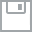
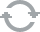
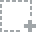
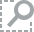
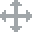
...
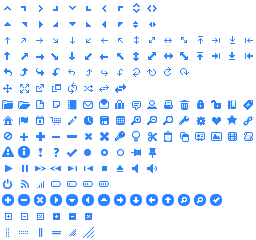
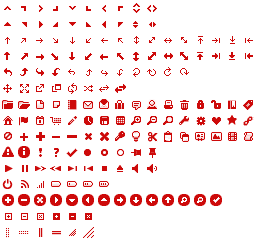
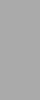
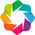
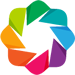

In [15]:
plotScatter(df,'REC','FIR','other_benefits','other_salaries',legLoc='top_right')

### From the second plot (PC1 vs PC3):
DPH is higher for PC3 and the Fire Dept is lower for PC3. Based on the loadings for PC3, both overtime and 'health_dental' are negatively correlated with PC3. So we expect Dept. Public Health to have low overtime and health/dental. And vice versa for the Fire Department


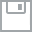
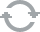
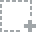
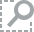
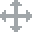
...
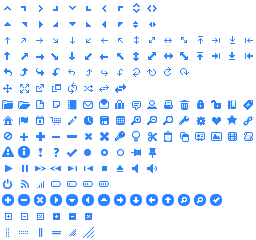
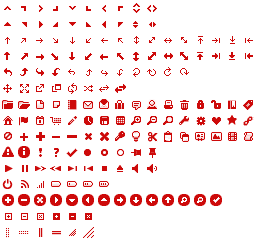
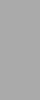
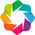
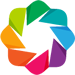

In [16]:
plotScatter(newData,'DPH','FIR','health_dental','overtime',legLoc='top_left')

### Again, the loadings pushed us in the right direction...
and plotting the data gives an exact sense of the distributions of departments and individual data points. Looks like being a firefighter is a pretty nice gig, but you can expect to be working plenty of overtime (sometimes over $80,000 worth of overtime!!).

# Wrapping up

There you have it. The goal of this notebook was to dig into a dataset with no _a priori_ knowledge and find something interesting. To do this we combined statistical learning with interactive data visualizations to find which variables were driving inter-department differences.

P.S. Did you notice that all the plots shown were called as a one-liner? Such a simple function (see below)! Perhaps an interactive app could be in order? I'll show that one next time. Thanks for reading!

### Appendix

In [17]:
def plotPCA(myData,dpt1,dpt2,xVar,yVar,legLoc="bottom_left"):

    from bokeh.plotting import figure, output_file, show, ColumnDataSource, output_notebook
    from bokeh.models import HoverTool, Select

    output_notebook()
    
    newData = myData
    nAll = newData    
    n1 = newData[newData['department_code']==dpt1]
    n2 = newData[newData['department_code']==dpt2]

    sAll = ColumnDataSource(
            data=dict(
                x = nAll[xVar],
                y = nAll[yVar],
                totSal = nAll['total_salary'],
                totCom = nAll['total_compensation'],
                dept = nAll['department'],
                totBen = nAll['total_benefits'],
                job = nAll['job']
            )
        )

    s1 = ColumnDataSource(
            data=dict(
                x = n1[xVar],
                y = n1[yVar],
                totSal = n1['total_salary'],
                totCom = n1['total_compensation'],
                dept = n1['department'],
                totBen = n1['total_benefits'],
                job = n1['job']
            )
        )

    s2 = ColumnDataSource(
            data=dict(
                x = n2[xVar],
                y = n2[yVar],
                totSal = n2['total_salary'],
                totCom = n2['total_compensation'],
                dept = n2['department'],
                totBen = n2['total_benefits'],
                job = n2['job']
            )
        )

    p = figure(plot_width=500, plot_height=400, tools="hover,pan,box_zoom,reset,save",
               title="PCA of SF employees", y_axis_label = yVar,
               x_axis_label = xVar)

    hover = p.select(dict(type=HoverTool))


    hover.tooltips = [
        ("Dept", "@dept"),
        ("Job", "@job"),
        ("Tot comp ($)", "@totCom"),
        ("Tot sal ($)", "@totSal"),
        ("Tot bnft ($)","@totBen")
    ]

    p.circle('x', 'y', size=4, legend="All", source=sAll,fill_color=None, line_color="black",alpha=0.4)
    p.circle('x', 'y', size=4, legend=dpt1, source=s1,color='darkcyan',alpha=0.6)
    p.circle('x', 'y', size=4, legend=dpt2, source=s2,color='red',alpha=0.6)

    p.legend.orientation = legLoc

    show(p)

def plotScatter(myData,dpt1,dpt2,xVar,yVar,legLoc="bottom_left"):

    from bokeh.plotting import figure, output_file, show, ColumnDataSource, output_notebook
    from bokeh.models import HoverTool, Select

    output_notebook()
    
    df = myData
    nAll = df
    n1 = df[df['department_code']==dpt1]
    n2 = df[df['department_code']==dpt2]

    sAll = ColumnDataSource(
            data=dict(
                x = nAll[xVar],
                y = nAll[yVar],
                totSal = nAll['total_salary'],
                totCom = nAll['total_compensation'],
                dept = nAll['department'],
                totBen = nAll['total_benefits'],
                job = nAll['job']
            )
        )

    s1 = ColumnDataSource(
            data=dict(
                x = n1[xVar],
                y = n1[yVar],
                totSal = n1['total_salary'],
                totCom = n1['total_compensation'],
                dept = n1['department'],
                totBen = n1['total_benefits'],
                job = n1['job']
            )
        )

    s2 = ColumnDataSource(
            data=dict(
                x = n2[xVar],
                y = n2[yVar],
                totSal = n2['total_salary'],
                totCom = n2['total_compensation'],
                dept = n2['department'],
                totBen = n2['total_benefits'],
                job = n2['job']
            )
        )

    p = figure(plot_width=500, plot_height=400, tools="hover,pan,box_zoom,reset,save",
               title="SF public employee salaries", y_axis_label = yVar,
               x_axis_label = xVar)

    hover = p.select(dict(type=HoverTool))


    hover.tooltips = [
        ("Dept", "@dept"),
        ("Job", "@job"),
        ("Tot comp ($)", "@totCom"),
        ("Tot sal ($)", "@totSal"),
        ("Tot bnft ($)","@totBen")
    ]

    p.circle('x', 'y', size=5, legend="All", source=sAll,fill_color=None, line_color="black",alpha=0.4)
    p.circle('x', 'y', size=5, legend=dpt1, source=s1,color='darkcyan',alpha=0.6)
    p.circle('x', 'y', size=5, legend=dpt2, source=s2,color='red',alpha=0.6)

    p.legend.orientation = legLoc

    show(p)